[__<< Feature Engineering__](./04_Divvy_feature_engineering.ipynb) | [__Home__](../README.md)

# Divvy: Bike Sharing Forecast
## ARIMAX: Modeling & Validation

__Dataset:__ [Divvy Data](https://divvybikes.com/system-data) \
__Author:__ [Dmitry Luchkin](https://www.linkedin.com/in/dmitry-luchkin/) \
__Date:__ April 2025

> **Attention**
>
> The data utilized in this project were sourced from the official public data provided by Divvy. All analysis, results, and insights presented in this notebook were conducted and formulated by Dmitry Luchkin. I declare that I am not affiliated with Divvy, Lyft, the City of Chicago, or any associated organizations. The views and interpretations expressed herein are solely my own and do not represent the positions or policies of these entities.

### Notebooks <a class="anchor" name='notebooks'></a>

+ [Initial Data Exploration](./01_Divvy_data_exploration.ipynb)
+ [Data Cleaning](./02_Divvy_data_cleaning.ipynb)
+ [Exploratory Data Analysis](./03_Divvy_exploratory_data_analysis.ipynb)
+ [Feature Engineering](./04_Divvy_feature_engineering.ipynb)
+ Modeling & Validation:
  - [XGBoost: Modeling & Validation](./05.1_Divvy_modeling_xgboost.ipynb)
  - [RNN: Modeling & Validation](./05.2_Divvy_modeling_rnn.ipynb)
  - __[ARIMAX: Modeling & Validation](./05.3_Divvy_modeling_arimax.ipynb)__
  - [MSTL: Modeling & Validation](./05.4_Divvy_modeling_mstl.ipynb)
  - [Ensemble: Modeling & Validation](./05.5_Divvy_modeling_ensemble.ipynb)
+ [Forecasting](./06_Divvy_forecasting.ipynb)

### Import Libraries <a name='import-libraries'></a>

In [1]:
import os 
import sys
import pickle
import warnings

import pandas as pd
import numpy as np
import statsmodels as sm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_absolute_error
from sktime.split import temporal_train_test_split
from sktime.utils.plotting import plot_series

from pmdarima import auto_arima

warnings.filterwarnings("ignore")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
sys.path.append('../02_scripts/')

# import project code
from utils.plotting import notebook_setup
from utils.plotting.notebook_setup import TRAIN_COLOR, TEST_COLOR, FORECAST_COLOR
from utils.plotting.viz import plot_trips, distplot, check_residuals, plot_window_size
from utils.model.seed import set_seed
from utils.model.arimax import train_validate_harmonic_arima, stationary_test, run_harimax, get_best_model

2025-04-30 14:37:36.695852: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Loading Data <a name='loading-data'></a>

In [3]:
train_filename = "../00_data/02_processed/divvy_train.pkl"
test_filename = "../00_data/02_processed/divvy_test.pkl"
train = None
test = None
# load training set
with open(train_filename, 'rb') as f:
        train = pickle.load(f)

# load test set
with open(test_filename, 'rb') as f:
        test = pickle.load(f)

#### Daily total number of bike trips

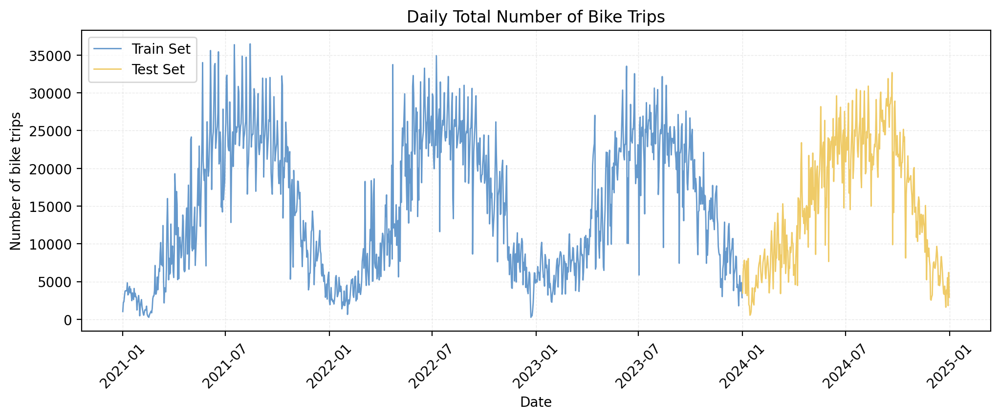

In [4]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
plot_trips(ax, train["total_rides"], test["total_rides"], title="Daily Total Number of Bike Trips")
plt.show()

#### Daily sub-total number of bike trips

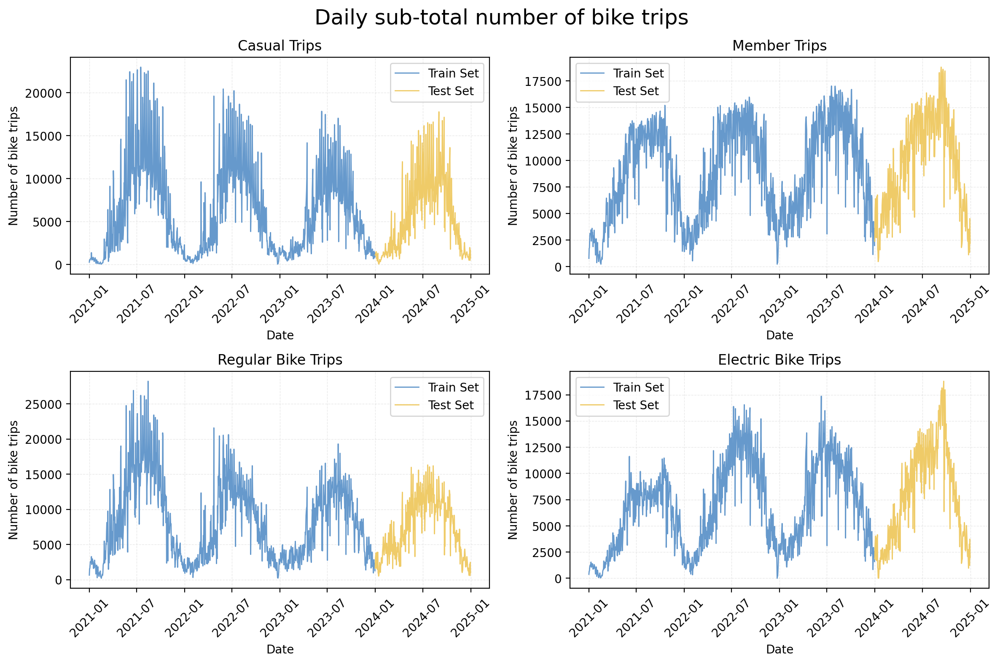

In [5]:
_, ax = plt.subplots(2, 2, figsize=(12, 8))
plot_trips(ax[0, 0], train["casual_total"], test["casual_total"], title="Casual Trips")
plot_trips(ax[0, 1], train["member_total"], test["member_total"], title="Member Trips")
plot_trips(ax[1, 0], train["regular_total"], test["regular_total"], title="Regular Bike Trips")
plot_trips(ax[1, 1], train["electric_total"], test["electric_total"], title="Electric Bike Trips")
plt.suptitle("Daily sub-total number of bike trips", fontsize=18)
plt.tight_layout()
plt.show()

#### Daily number of trips by bike type and user type

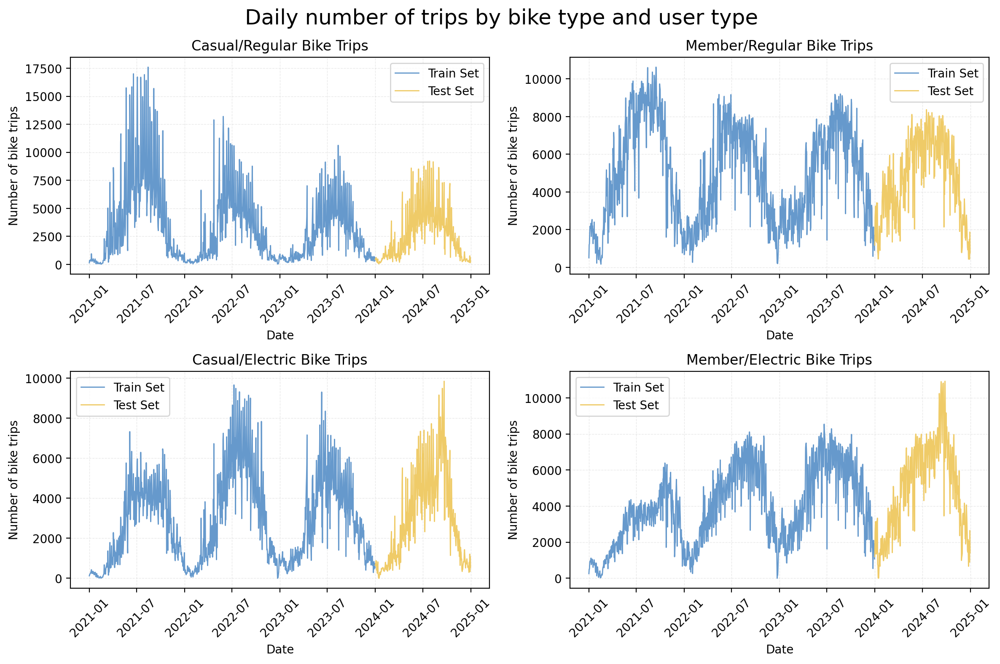

In [6]:
_, ax = plt.subplots(2, 2, figsize=(12, 8))
plot_trips(ax[0, 0], train["casual_regular_bike"], test["casual_regular_bike"], title="Casual/Regular Bike Trips")
plot_trips(ax[0, 1], train["member_regular_bike"], test["member_regular_bike"], title="Member/Regular Bike Trips")
plot_trips(ax[1, 0], train["casual_electric_bike"], test["casual_electric_bike"], title="Casual/Electric Bike Trips")
plot_trips(ax[1, 1], train["member_electric_bike"], test["member_electric_bike"], title="Member/Electric Bike Trips")
plt.suptitle("Daily number of trips by bike type and user type", fontsize=18)
plt.tight_layout()
plt.show()

### Hierarchical Forecasting

Hierarchical forecasting aims to produce forecasts that are both accurate and consistent across levels of the hierarchy.

Two primary approaches are used for hierarchical forecasting:

+ __Bottom-Up Approach__
  The bottom-up method starts by forecasting the most granular (lowest-level) series independently. These forecasts are then aggregated upward to obtain predictions for higher levels in the hierarchy.

+ __Top-Down Approach__
  The top-down method begins by forecasting the top-level (aggregate) series. These forecasts are then disaggregated downward based on historical proportions or predictive models.

In [7]:
arimax_mae_scores = {"bottom-up": 
              {
                  "mae":{
                      "total_rides": None,
                      "regular_total": None,
                      "electric_total": None,
                      "casual_total": None,
                      "member_total": None,
                      "casual_regular_bike": None,
                      "member_regular_bike": None,
                      "casual_electric_bike": None,
                      "member_electric_bike": None
                  }
              },
              "top-down":
              {
                    "mae":{
                        "total_rides": None,
                        "regular_total": None,
                        "electric_total": None,
                        "casual_total": None,
                        "member_total": None,
                        "casual_regular_bike": None,
                        "member_regular_bike": None,
                        "casual_electric_bike": None,
                        "member_electric_bike": None
                    }         
              }
}

#### Top-Down

![Top-Down Approach](./00_images/top_down.png)

In [8]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox

train_total_rides_transformed, lambda_ = boxcox(train["total_rides"])

-- Dickey–Fuller test --
ADF Statistic: -1.895580113415669
p-value: 0.33414321320566515
Time series is non stationary
-- KPSS test --
ADF Statistic: 0.2784836108064847
p-value: 0.1
Time series is stationary


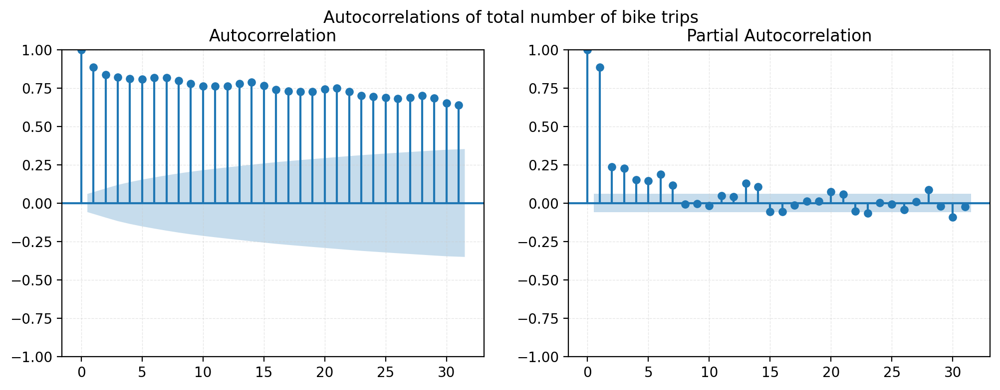

In [9]:
stationary_test(train_total_rides_transformed)
plt.suptitle("Autocorrelations of total number of bike trips")
plt.show()

-- Dickey–Fuller test --
ADF Statistic: -8.413275851047938
p-value: 2.0760188664829768e-13
Time series is stationary
-- KPSS test --
ADF Statistic: 0.16264323064177674
p-value: 0.1
Time series is stationary


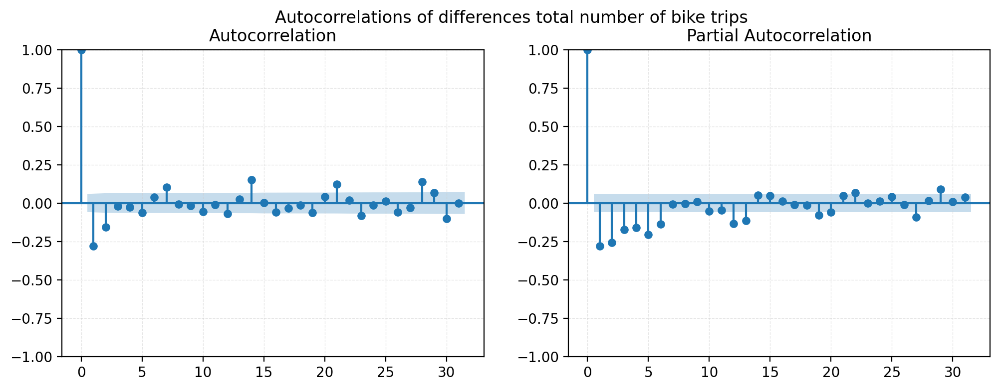

In [10]:
# differences
stationary_test(np.diff(train_total_rides_transformed))
plt.suptitle("Autocorrelations of differences total number of bike trips")
plt.show()

Differencing may be required for SARIMA. We will test the model on both the original and differenced series.

SARIMA is generally not suitable for long-term forecasting, as it relies heavily on past values and errors, causing predictions to flatten over time. However, iterative updating and forecasting with SARIMA can improve accuracy over longer horizons by incorporating new observations step by step.

In [11]:
steps_ahead = 14

auto_model = auto_arima(train_total_rides_transformed[:-steps_ahead], 
                        seasonal=True, 
                        m=7, # weekly seasonality
                        max_p=6, max_q=5, max_P=5, max_Q=5,
                        stepwise=True,
                        suppress_warnings=True,
                        information_criterion="bic",
                        error_action="ignore",
                        trace=True)

Performing stepwise search to minimize bic
 ARIMA(2,1,2)(1,0,1)[7] intercept   : BIC=inf, Time=2.03 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : BIC=12546.656, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : BIC=12452.852, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : BIC=12342.774, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[7]             : BIC=12539.675, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : BIC=12345.565, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : BIC=12265.303, Time=0.62 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : BIC=12339.297, Time=0.33 sec
 ARIMA(0,1,1)(2,0,1)[7] intercept   : BIC=12261.492, Time=1.50 sec
 ARIMA(0,1,1)(2,0,0)[7] intercept   : BIC=12310.389, Time=1.11 sec
 ARIMA(0,1,1)(3,0,1)[7] intercept   : BIC=12267.937, Time=3.68 sec
 ARIMA(0,1,1)(2,0,2)[7] intercept   : BIC=12267.565, Time=2.26 sec
 ARIMA(0,1,1)(1,0,2)[7] intercept   : BIC=12260.966, Time=1.34 sec
 ARIMA(0,1,1)(0,0,2)[7] intercept   : BIC=12324.895, Time=0.88 sec
 ARIMA(0,1,1)(1,0,3)[7] i

In [12]:
auto_model

ARIMA(order=(1, 1, 1), scoring_args={}, seasonal_order=(1, 0, 1, 7),
      suppress_warnings=True, with_intercept=False)

In [13]:
sarima_test_preds = []

# warm up the model
for i in range(len(train) - steps_ahead, len(train)):
    auto_model.update([train_total_rides_transformed[i]])
    
# prediction
for i in range(len(test)):
    pred = auto_model.predict(1)[0]
    sarima_test_preds.append(pred)
    true_val = boxcox(test.iloc[i]["total_rides"], lmbda=lambda_)
    auto_model.update([true_val])

sarima_test_preds_inv = inv_boxcox(sarima_test_preds, lambda_)

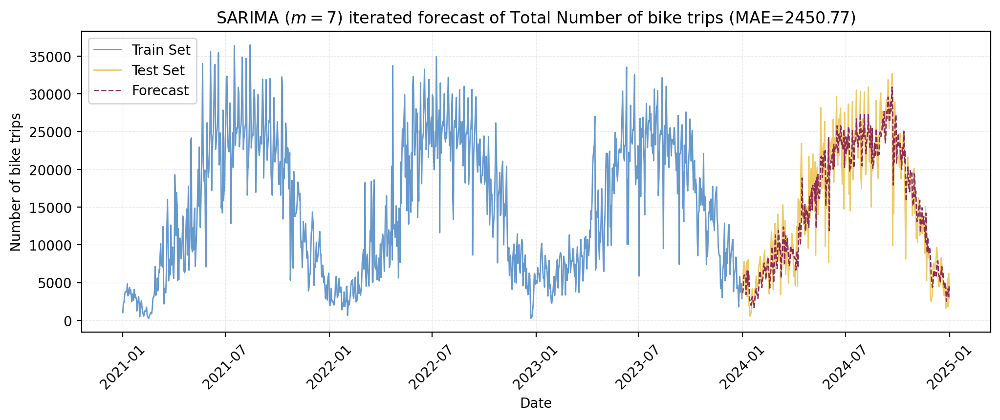

In [14]:
sarima_mae = mean_absolute_error(test["total_rides"], sarima_test_preds_inv)

# viz
fig, ax = plt.subplots(1, 1, figsize=(12, 4))
plot_trips(ax=ax, 
           train=train["total_rides"], 
           test=test["total_rides"], 
           forecast=pd.DataFrame(sarima_test_preds_inv, test.index),
          title=f"SARIMA ($m=7$) iterated forecast of Total Number of bike trips (MAE={sarima_mae:.2f})")

plt.show()

In [15]:
# check residuals
sarima_residuals = test["total_rides"] - sarima_test_preds_inv

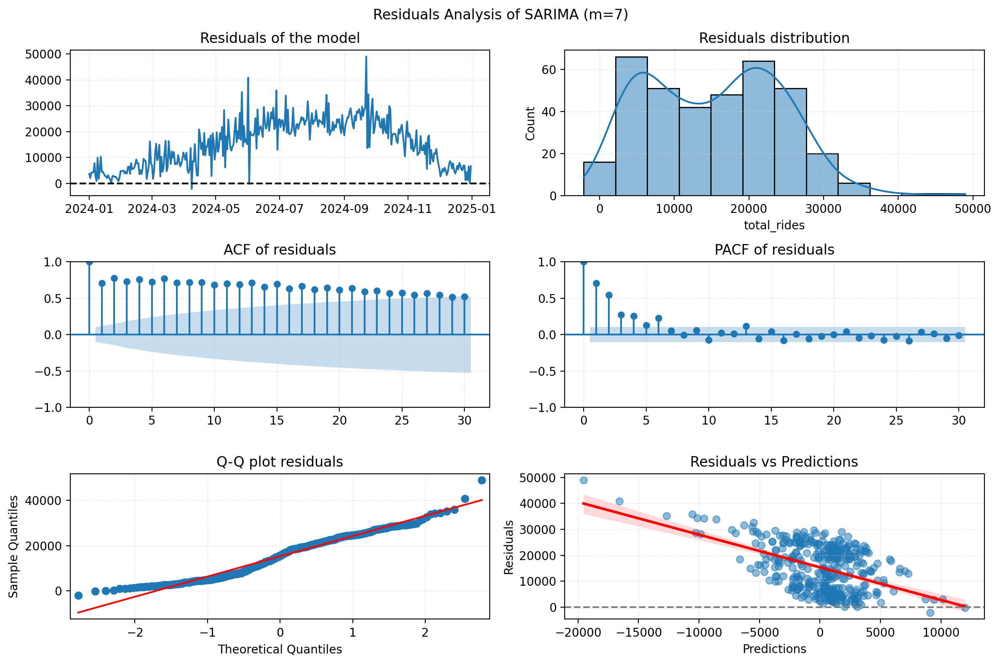


--- Ljung-Box Test ---
      lb_stat  lb_pvalue
10 1,985.2958     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -1.0855416757183787
p-value: 0.7208031436436592
Time series is non stationary

-- KPSS test --
ADF Statistic: 0.681976877805106
p-value: 0.01
Time series is non stationary


In [16]:
check_residuals(sarima_test_preds_inv, sarima_residuals, "SARIMA (m=7)")

There are autocorrelations in the residuals, these could be seasonal components with different periods.

##### ARIMAX with harmonic features

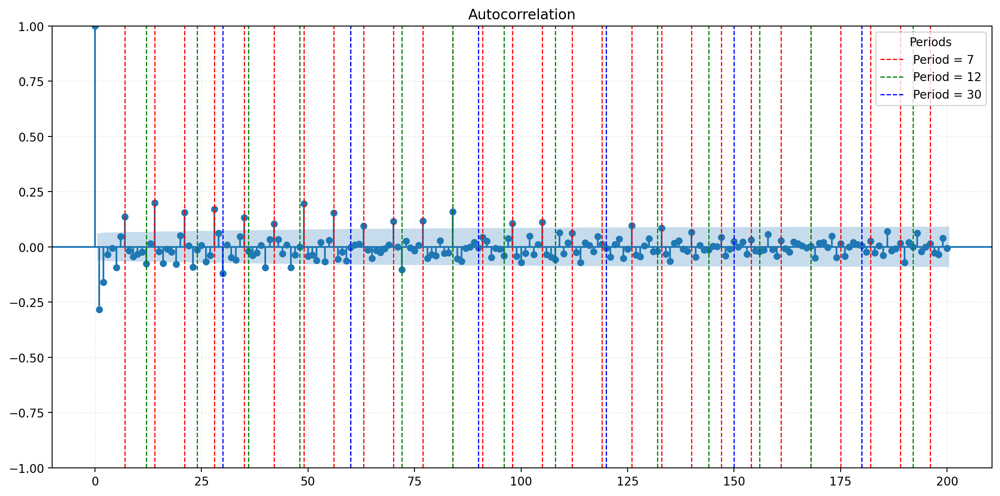

In [17]:
from statsmodels.graphics.tsaplots import plot_acf
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1, 1, figsize=(12, 6))

LAGS = 200

plot_acf(np.diff(train["total_rides"]), ax=ax, lags=LAGS)

# m = 7
for i in range(7, LAGS, 7):
    ax.axvline(x=i, color="red", lw=1, linestyle="--")

# m = 12
for i in range(12, LAGS, 12):
    ax.axvline(x=i, color="green", lw=1, linestyle="--")

# m = 30
for i in range(30, LAGS, 30):
    ax.axvline(x=i, color="blue", lw=1, linestyle="--")

legend_handles = [
    Line2D([0], [0], color="red",   lw=1, linestyle="--", label="Period = 7"),
    Line2D([0], [0], color="green", lw=1, linestyle="--", label="Period = 12"),
    Line2D([0], [0], color="blue",  lw=1, linestyle="--", label="Period = 30"),
]

ax.legend(handles=legend_handles, title="Periods", loc="upper right")

plt.tight_layout()
plt.show()

In [18]:
harmonic_periods=[7, 12, 30.44, 91.31, 182.62, 365.25]
harmonics_per_periods=[3, 3, 3, 3, 3, 3]
features = ['is_holiday', 'year',
       'quarter', 'month', 'day', 'season', 'weekday', 'temp', 'feelslike',
       'humidity', 'precip', 'precipprob', 'precipcover', 'snow', 'snowdepth',
       'windgust', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'visibility', 'Clear', 'Freezing Drizzle/Freezing Rain', 'Ice',
       'Overcast', 'Partially cloudy', 'Rain', 'Snow']

In [19]:
td_total_results = run_harimax(train, test, "total_rides", features, harmonic_periods, harmonics_per_periods)
best_td_total_result = get_best_model(td_total_results)


--- total_rides ---
Searching the best model...
The best model for total_rides has order (5, 0, 6)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast of total_rides: 1773.97



--- total_rides ---
Searching the best model...
The best model for total_rides has order (5, 0, 5)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of iterative forecast of total_rides: 1482.80



--- total_rides ---
Searching the best model...
The best model for total_rides has order (5, 1, 5)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast w/ differencing of total_rides: 1950.19



--- total_rides ---
Searching the best model...
The best model for total_rides has order (5, 1, 5)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of iterative forecast w/ differencing of total_rides: 1443.27


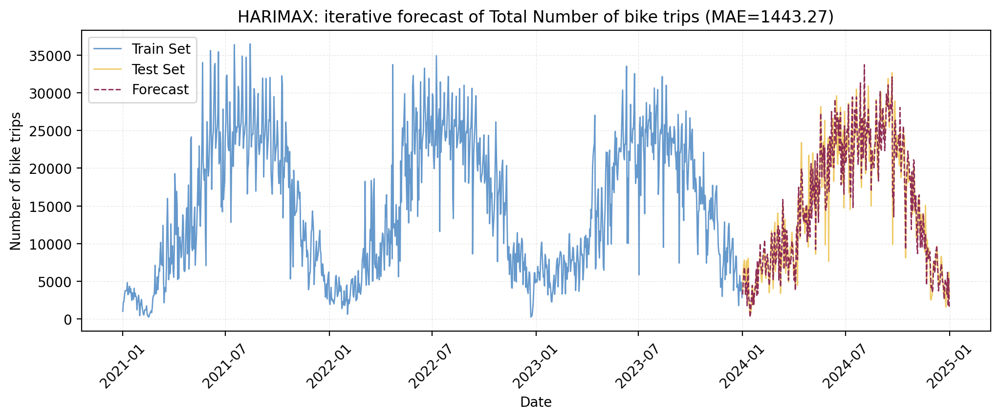

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(12, 4))
plot_trips(ax=ax, 
           train=train["total_rides"], 
           test=test["total_rides"], 
           forecast=pd.DataFrame(best_td_total_result["forecast"], test.index),
           title=f"HARIMAX: {best_td_total_result["forecast_type"]} forecast of Total Number of " +\
                               f"bike trips (MAE={best_td_total_result["mae"]:.2f})")

plt.show()

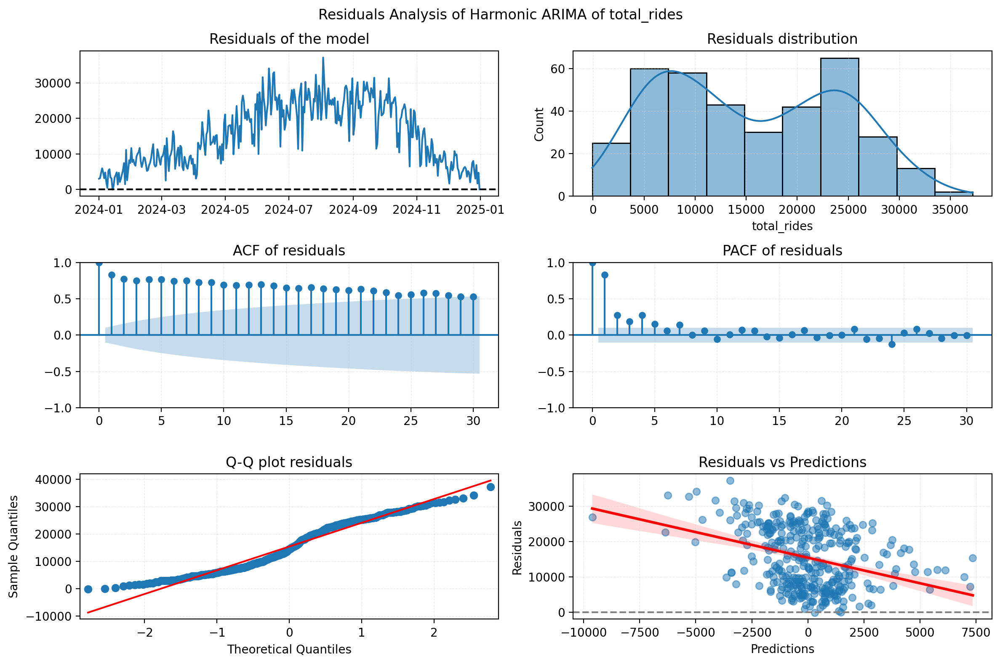


--- Ljung-Box Test ---
      lb_stat  lb_pvalue
10 2,112.7467     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -1.447332158026892
p-value: 0.5593861211962935
Time series is non stationary

-- KPSS test --
ADF Statistic: 0.6919251524768762
p-value: 0.01
Time series is non stationary


In [21]:
check_residuals(best_td_total_result["forecast"], 
                test["total_rides"] - best_td_total_result["forecast"], 
                "Harmonic ARIMA of total_rides")

In [22]:
arimax_mae_scores['top-down']['mae']['total_rides'] =  best_td_total_result["mae"]

##### Down-level forecast distribution

In [23]:
train_totals = train[['casual_regular_bike', 'member_regular_bike', 'casual_electric_bike',
       'member_electric_bike']].sum()
props =  train_totals / train_totals.sum()
props

casual_regular_bike    0.2164
member_regular_bike    0.3312
casual_electric_bike   0.1902
member_electric_bike   0.2621
dtype: float64

In [24]:
arimax_td_bottom_forecast = pd.DataFrame({
    node: best_td_total_result["forecast"] * prop for node, prop in props.items()
})
arimax_td_bottom_forecast.index = test.index
arimax_td_bottom_forecast.head()

,casual_regular_bike,member_regular_bike,casual_electric_bike,member_electric_bike
2024-01-01,701.8534,"1,074.0413",616.8814,850.0424
2024-01-02,"1,020.4542","1,561.5937",896.9098,"1,235.9123"
2024-01-03,"1,284.1014","1,965.0511","1,128.6377","1,555.2258"
2024-01-04,"1,487.4516","2,276.2365","1,307.3687","1,801.5113"
2024-01-05,"1,294.1339","1,980.4038","1,137.4556","1,567.3766"


In [25]:
arimax_td_casual_regular_mae = mean_absolute_error(test["casual_regular_bike"], arimax_td_bottom_forecast["casual_regular_bike"])
arimax_td_member_regular_mae = mean_absolute_error(test["member_regular_bike"], arimax_td_bottom_forecast["member_regular_bike"])
arimax_td_casual_electric_mae = mean_absolute_error(test["casual_electric_bike"], arimax_td_bottom_forecast["casual_electric_bike"])
arimax_td_member_electric_mae = mean_absolute_error(test["member_electric_bike"], arimax_td_bottom_forecast["member_electric_bike"])

In [26]:
arimax_mae_scores['top-down']['mae']['casual_regular_bike'] = arimax_td_casual_regular_mae
arimax_mae_scores['top-down']['mae']['member_regular_bike'] = arimax_td_member_regular_mae
arimax_mae_scores['top-down']['mae']['casual_electric_bike'] = arimax_td_casual_electric_mae
arimax_mae_scores['top-down']['mae']['member_electric_bike'] = arimax_td_member_electric_mae

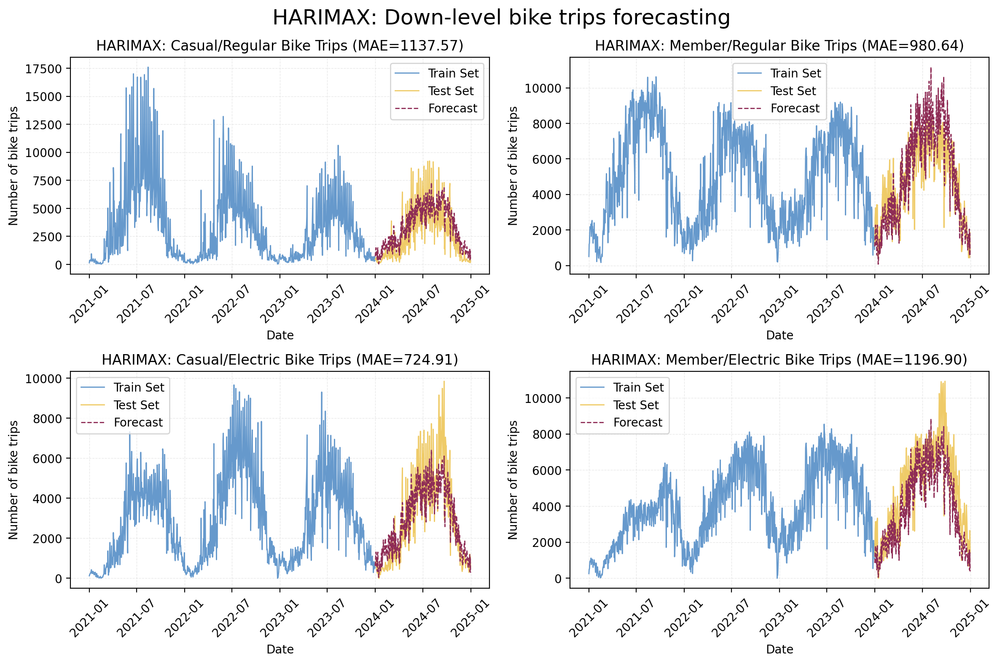

In [27]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8), facecolor='white')

plot_trips(train=train["casual_regular_bike"], 
                    test=test["casual_regular_bike"],
                    forecast=arimax_td_bottom_forecast["casual_regular_bike"],
                    title=f"HARIMAX: Casual/Regular Bike Trips (MAE={arimax_td_casual_regular_mae:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_regular_bike"], 
                    test=test["member_regular_bike"],
                    forecast=arimax_td_bottom_forecast["member_regular_bike"],
                    title=f"HARIMAX: Member/Regular Bike Trips (MAE={arimax_td_member_regular_mae:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["casual_electric_bike"], 
                    test=test["casual_electric_bike"],
                    forecast=arimax_td_bottom_forecast["casual_electric_bike"],
                    title=f"HARIMAX: Casual/Electric Bike Trips (MAE={arimax_td_casual_electric_mae:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["member_electric_bike"], 
                    test=test["member_electric_bike"],
                    forecast=arimax_td_bottom_forecast["member_electric_bike"],
                    title=f"HARIMAX: Member/Electric Bike Trips (MAE={arimax_td_member_electric_mae:.2f})",
                    ax=ax[1, 1])

plt.suptitle("HARIMAX: Down-level bike trips forecasting", fontsize=18)
plt.tight_layout()
plt.show()

##### Bottom-up forecasting from leaf-level to cross-level

In [28]:
arimax_td_bu_casual_total_forecast = arimax_td_bottom_forecast["casual_regular_bike"] + \
                                arimax_td_bottom_forecast["casual_electric_bike"]
arimax_td_bu_member_total_forecast = arimax_td_bottom_forecast["member_regular_bike"] + \
                                arimax_td_bottom_forecast["member_electric_bike"]
arimax_td_bu_electric_total_forecast = arimax_td_bottom_forecast["member_electric_bike"] + \
                                  arimax_td_bottom_forecast["casual_electric_bike"]
arimax_td_bu_regular_total_forecast = arimax_td_bottom_forecast["member_regular_bike"] + \
                                 arimax_td_bottom_forecast["casual_regular_bike"]

arimax_td_bu_casual_total_mae = mean_absolute_error(test["casual_total"], arimax_td_bu_casual_total_forecast)
arimax_td_bu_member_total_mae = mean_absolute_error(test["member_total"], arimax_td_bu_member_total_forecast)
arimax_td_bu_electric_total_mae = mean_absolute_error(test["electric_total"], arimax_td_bu_electric_total_forecast)
arimax_td_bu_regular_total_mae = mean_absolute_error(test["regular_total"], arimax_td_bu_regular_total_forecast)

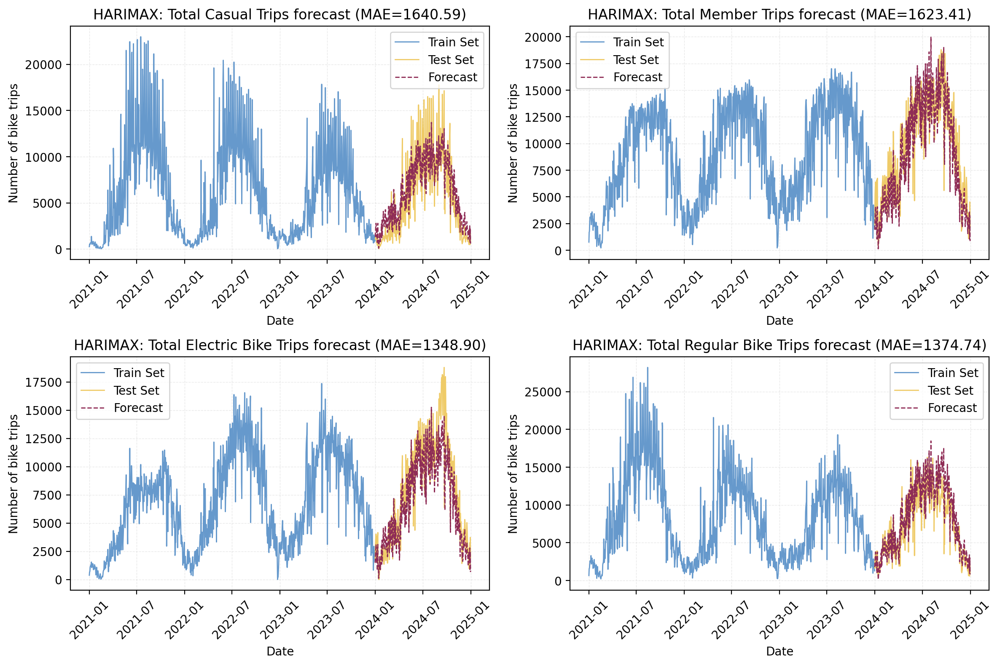

In [29]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

plot_trips(train=train["casual_total"], 
                    test=test["casual_total"],
                    forecast=arimax_td_bu_casual_total_forecast,
                    title=f"HARIMAX: Total Casual Trips forecast (MAE={arimax_td_bu_casual_total_mae:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_total"], 
                    test=test["member_total"],
                    forecast=arimax_td_bu_member_total_forecast,
                    title=f"HARIMAX: Total Member Trips forecast (MAE={arimax_td_bu_member_total_mae:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["electric_total"], 
                    test=test["electric_total"],
                    forecast=arimax_td_bu_electric_total_forecast,
                    title=f"HARIMAX: Total Electric Bike Trips forecast (MAE={arimax_td_bu_electric_total_mae:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["regular_total"], 
                    test=test["regular_total"],
                    forecast=arimax_td_bu_regular_total_forecast,
                    title=f"HARIMAX: Total Regular Bike Trips forecast (MAE={arimax_td_bu_regular_total_mae:.2f})",
                    ax=ax[1, 1])

plt.tight_layout()
plt.show()

In [30]:
arimax_mae_scores['top-down']['mae']['casual_total'] = arimax_td_bu_casual_total_mae
arimax_mae_scores['top-down']['mae']['member_total'] = arimax_td_bu_member_total_mae
arimax_mae_scores['top-down']['mae']['electric_total'] = arimax_td_bu_electric_total_mae
arimax_mae_scores['top-down']['mae']['regular_total'] = arimax_td_bu_regular_total_mae

#### Bottom-Up

![Bottom-Up Approach](./00_images/bottom_up.png)

##### Casual/Regular

In [31]:
# casual/regular
harimax_cr_results = run_harimax(train, test, "casual_regular_bike", 
                         features, harmonic_periods, harmonics_per_periods)
harimax_cr_result = get_best_model(harimax_cr_results)


--- casual_regular_bike ---
Searching the best model...
The best model for casual_regular_bike has order (5, 0, 6)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast of casual_regular_bike: 529.16



--- casual_regular_bike ---
Searching the best model...
The best model for casual_regular_bike has order (5, 0, 6)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of iterative forecast of casual_regular_bike: 406.60



--- casual_regular_bike ---
Searching the best model...
The best model for casual_regular_bike has order (5, 1, 6)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast w/ differencing of casual_regular_bike: 664.28



--- casual_regular_bike ---
Searching the best model...
The best model for casual_regular_bike has order (5, 1, 6)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of it

In [32]:
print(f"Casual/Regular: MAE={harimax_cr_result["mae"]:.2f}, " + \
      f"order={harimax_cr_result["model_order"]}, d={harimax_cr_result["d"]}, " + \
      f"type={harimax_cr_result["forecast_type"]}")

Casual/Regular: MAE=406.60, order=(5, 0, 6), d=None, type=iterative


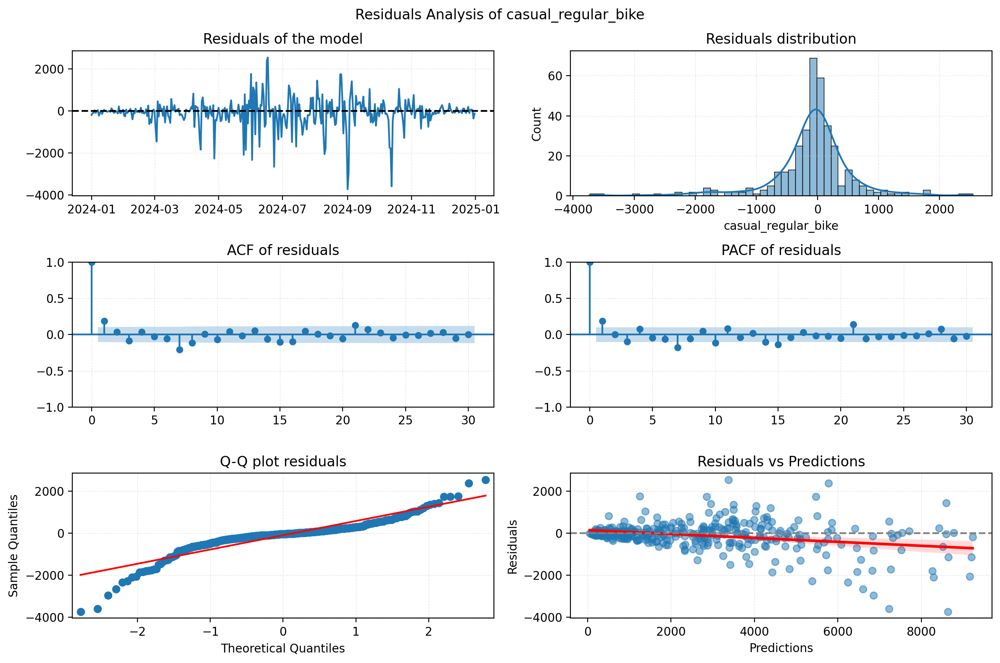


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  40.6916     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -6.71572396615554
p-value: 3.5862871170283516e-09
Time series is stationary

-- KPSS test --
ADF Statistic: 0.0275840067307807
p-value: 0.1
Time series is stationary


In [33]:
check_residuals(harimax_cr_result["forecast"], test["casual_regular_bike"], "casual_regular_bike")

##### Member/Regular

In [34]:
# member/regular
harimax_mr_results = run_harimax(train, test, "member_regular_bike", 
                         features, harmonic_periods, harmonics_per_periods)
harimax_mr_result = get_best_model(harimax_mr_results)


--- member_regular_bike ---
Searching the best model...
The best model for member_regular_bike has order (2, 0, 1)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast of member_regular_bike: 574.19



--- member_regular_bike ---
Searching the best model...
The best model for member_regular_bike has order (1, 0, 2)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of iterative forecast of member_regular_bike: 414.12



--- member_regular_bike ---
Searching the best model...
The best model for member_regular_bike has order (1, 1, 1)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast w/ differencing of member_regular_bike: 788.89



--- member_regular_bike ---
Searching the best model...
The best model for member_regular_bike has order (1, 1, 1)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of it

In [35]:
print(f"Member/Regular: MAE={harimax_mr_result["mae"]:.2f}, " + \
      f"order={harimax_mr_result["model_order"]}, d={harimax_mr_result["d"]}, " + \
      f"type={harimax_mr_result["forecast_type"]}")

Member/Regular: MAE=407.05, order=(1, 1, 1), d=1, type=iterative


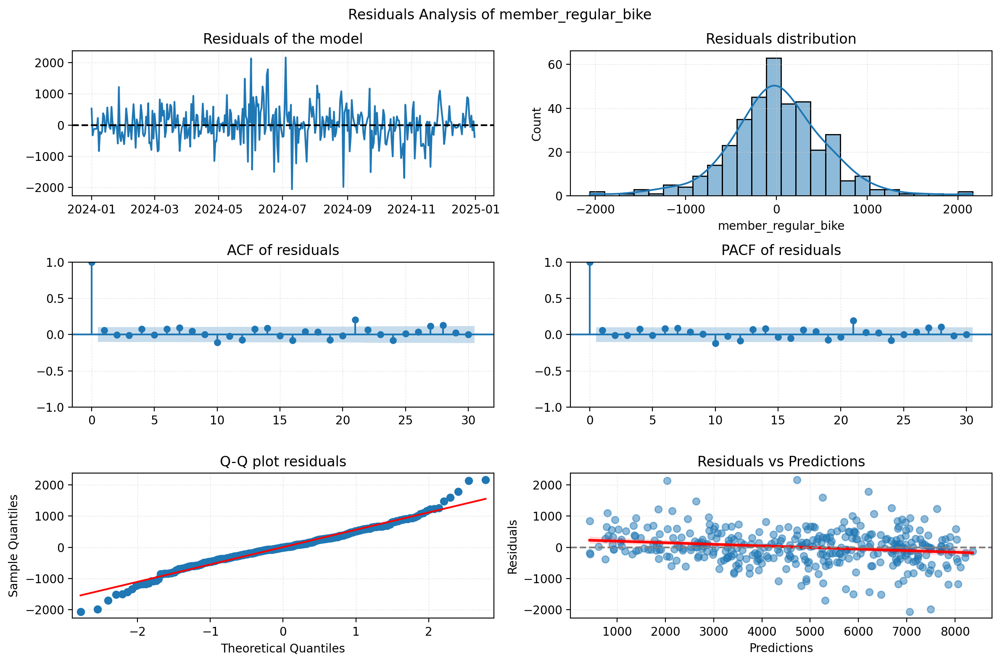


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  14.5671     0.1487
Residuals do not show significant autocorrelation

-- Dickey–Fuller test --
ADF Statistic: -17.985755587811834
p-value: 2.7650566739172144e-30
Time series is stationary

-- KPSS test --
ADF Statistic: 0.16352969102040565
p-value: 0.03539192414966195
Time series is non stationary


In [36]:
check_residuals(harimax_mr_result["forecast"], test["member_regular_bike"], "member_regular_bike")

##### Casual/Electric

In [37]:
# casual/electric
harimax_ce_results = run_harimax(train, test, "casual_electric_bike", 
                         features, harmonic_periods, harmonics_per_periods)
harimax_ce_result = get_best_model(harimax_ce_results)


--- casual_electric_bike ---
Searching the best model...
The best model for casual_electric_bike has order (5, 0, 5)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast of casual_electric_bike: 685.76



--- casual_electric_bike ---
Searching the best model...
The best model for casual_electric_bike has order (5, 0, 5)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of iterative forecast of casual_electric_bike: 403.52



--- casual_electric_bike ---
Searching the best model...
The best model for casual_electric_bike has order (6, 1, 6)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast w/ differencing of casual_electric_bike: 613.57



--- casual_electric_bike ---
Searching the best model...
The best model for casual_electric_bike has order (6, 1, 6)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion..

In [38]:
print(f"Casual/Electric: MAE={harimax_ce_result["mae"]:.2f}, " + \
      f"order={harimax_ce_result["model_order"]}, d={harimax_ce_result["d"]}, " + \
      f"type={harimax_ce_result["forecast_type"]}")

Casual/Electric: MAE=388.37, order=(6, 1, 6), d=1, type=iterative


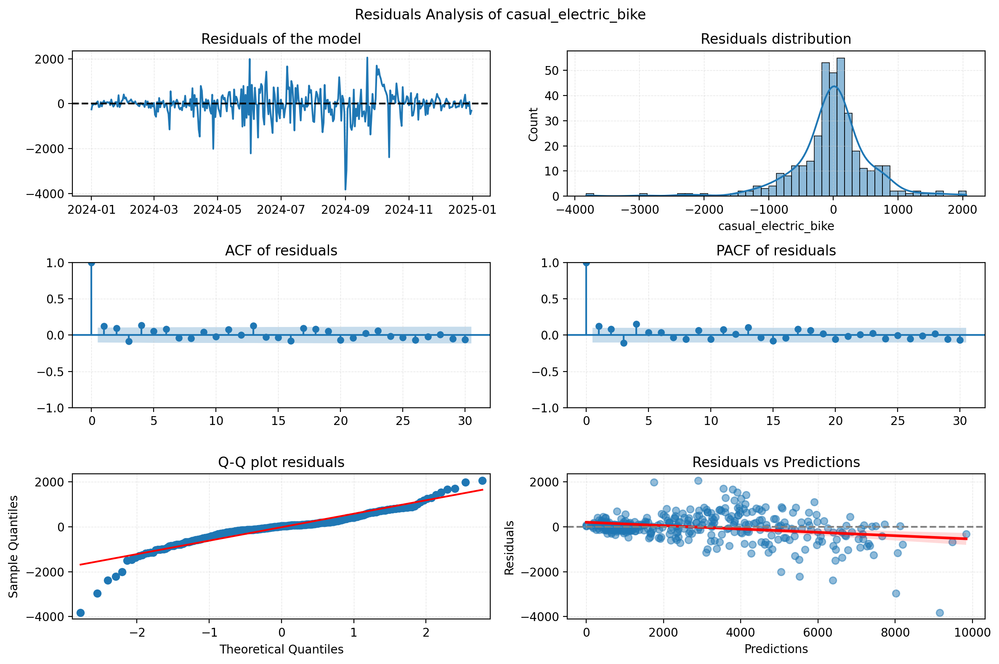


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  23.4597     0.0092
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -8.141985443625284
p-value: 1.022330052519679e-12
Time series is stationary

-- KPSS test --
ADF Statistic: 0.06613016780753525
p-value: 0.1
Time series is stationary


In [39]:
check_residuals(harimax_ce_result["forecast"], test["casual_electric_bike"], "casual_electric_bike")

##### Member/Electric

In [40]:
# member/electric
harimax_me_results = run_harimax(train, test, "member_electric_bike", 
                         features, harmonic_periods, harmonics_per_periods)
harimax_me_result = get_best_model(harimax_me_results)


--- member_electric_bike ---
Searching the best model...
The best model for member_electric_bike has order (3, 0, 4)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast of member_electric_bike: 858.67



--- member_electric_bike ---
Searching the best model...
The best model for member_electric_bike has order (3, 0, 4)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion...
MAE of iterative forecast of member_electric_bike: 423.83



--- member_electric_bike ---
Searching the best model...
The best model for member_electric_bike has order (3, 1, 3)
Direct Forecasting...
Boxcox Invertion...
MAE of direct forecast w/ differencing of member_electric_bike: 803.84



--- member_electric_bike ---
Searching the best model...
The best model for member_electric_bike has order (4, 1, 3)
Warming up the model...
Iterative Forecasting...
[##################################################] 100%

Boxcox Invertion..

In [41]:
print(f"Member/Electric: MAE={harimax_me_result["mae"]:.2f}, " + \
      f"order={harimax_me_result["model_order"]}, d={harimax_me_result["d"]}, " + \
      f"type={harimax_me_result["forecast_type"]}")

Member/Electric: MAE=423.83, order=(3, 0, 4), d=None, type=iterative


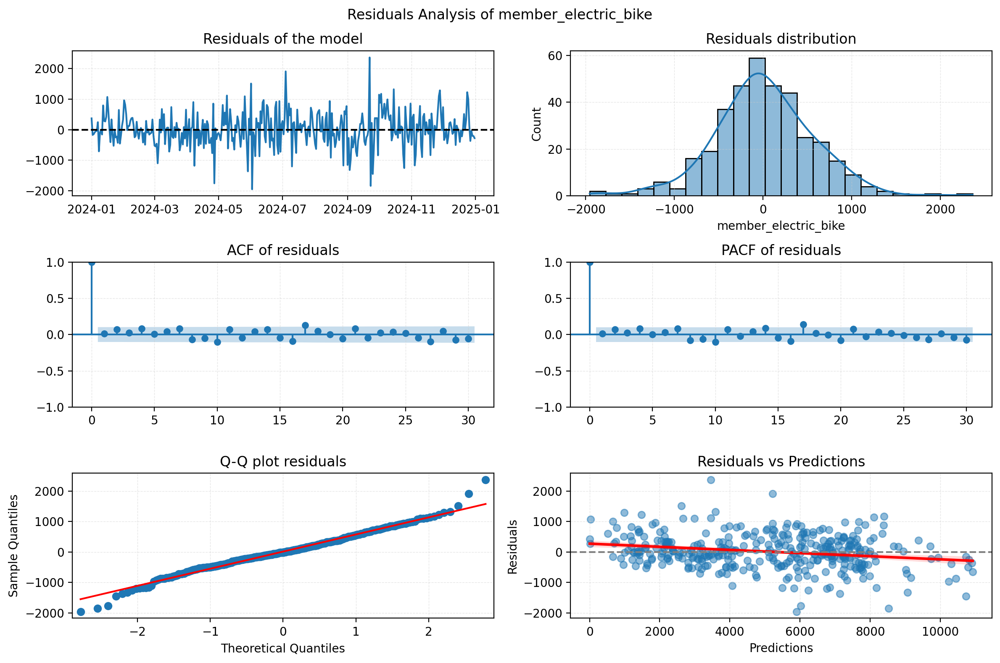


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  14.8143     0.1390
Residuals do not show significant autocorrelation

-- Dickey–Fuller test --
ADF Statistic: -18.818632135013726
p-value: 2.022235839048154e-30
Time series is stationary

-- KPSS test --
ADF Statistic: 0.05950697435045412
p-value: 0.1
Time series is stationary


In [42]:
check_residuals(harimax_me_result["forecast"], test["member_electric_bike"], "member_electric_bike")

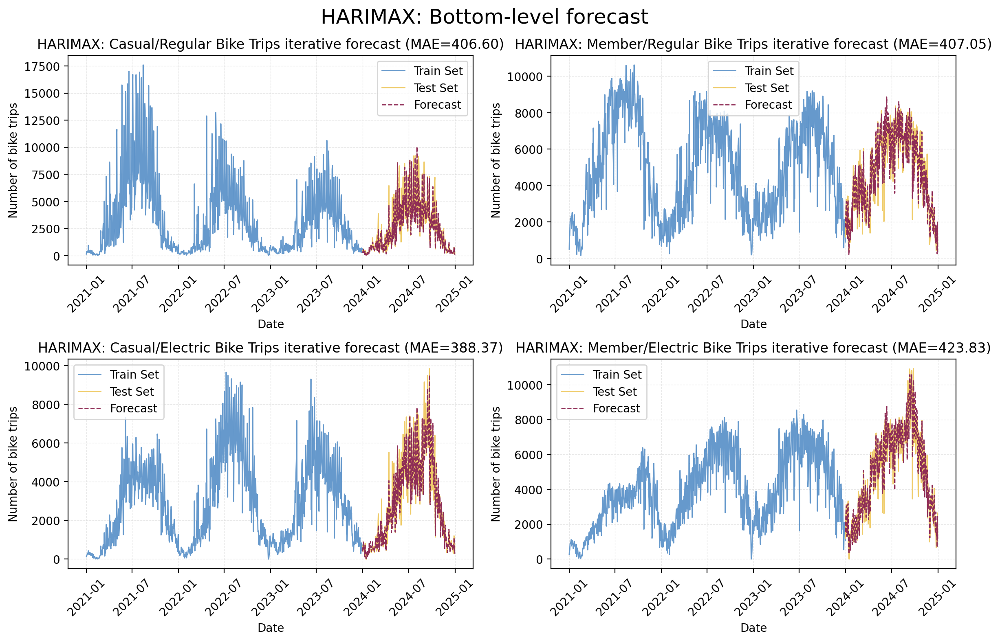

In [43]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8), facecolor='white')

plot_trips(train=train["casual_regular_bike"], 
                    test=test["casual_regular_bike"],
                    forecast=pd.DataFrame(harimax_cr_result["forecast"], index=test.index),
                    title=f"HARIMAX: Casual/Regular Bike Trips {harimax_cr_result["forecast_type"]} " + \
                           f"forecast (MAE={harimax_cr_result["mae"]:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_regular_bike"], 
                    test=test["member_regular_bike"],
                    forecast=pd.DataFrame(harimax_mr_result["forecast"], index=test.index),
                    title=f"HARIMAX: Member/Regular Bike Trips {harimax_mr_result["forecast_type"]} " + \
                           f"forecast (MAE={harimax_mr_result["mae"]:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["casual_electric_bike"], 
                    test=test["casual_electric_bike"],
                    forecast=pd.DataFrame(harimax_ce_result["forecast"], index=test.index),
                    title=f"HARIMAX: Casual/Electric Bike Trips {harimax_ce_result["forecast_type"]} " + \
                           f"forecast (MAE={harimax_ce_result["mae"]:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["member_electric_bike"], 
                    test=test["member_electric_bike"],
                    forecast=pd.DataFrame(harimax_me_result["forecast"], index=test.index),
                    title=f"HARIMAX: Member/Electric Bike Trips {harimax_me_result["forecast_type"]} " + \
                           f"forecast (MAE={harimax_me_result["mae"]:.2f})",
                    ax=ax[1, 1])

plt.suptitle("HARIMAX: Bottom-level forecast", fontsize=18)
plt.tight_layout()
plt.show()

In [44]:
arimax_mae_scores['bottom-up']['mae']['casual_regular_bike'] = harimax_cr_result["mae"]
arimax_mae_scores['bottom-up']['mae']['member_regular_bike'] = harimax_mr_result["mae"]
arimax_mae_scores['bottom-up']['mae']['casual_electric_bike'] = harimax_ce_result["mae"]
arimax_mae_scores['bottom-up']['mae']['member_electric_bike'] = harimax_me_result["mae"]

##### Sub-Total forecasting (Bottom-Up)

In [45]:
arimax_bu_casual_total_forecast = harimax_cr_result["forecast"] + harimax_ce_result["forecast"]
arimax_bu_member_total_forecast = harimax_mr_result["forecast"] + harimax_me_result["forecast"]
arimax_bu_electric_total_forecast = harimax_me_result["forecast"] + harimax_ce_result["forecast"]
arimax_bu_regular_total_forecast = harimax_cr_result["forecast"] + harimax_mr_result["forecast"]

arimax_bu_casual_total_mae = mean_absolute_error(test['casual_total'], arimax_bu_casual_total_forecast)
arimax_bu_member_total_mae = mean_absolute_error(test['member_total'], arimax_bu_member_total_forecast)
arimax_bu_electric_total_mae = mean_absolute_error(test['electric_total'], arimax_bu_electric_total_forecast)
arimax_bu_regular_total_mae = mean_absolute_error(test['regular_total'], arimax_bu_regular_total_forecast)

In [46]:
arimax_mae_scores['bottom-up']['mae']['casual_total'] = arimax_bu_casual_total_mae
arimax_mae_scores['bottom-up']['mae']['member_total'] = arimax_bu_member_total_mae
arimax_mae_scores['bottom-up']['mae']['electric_total'] = arimax_bu_electric_total_mae
arimax_mae_scores['bottom-up']['mae']['regular_total'] = arimax_bu_regular_total_mae

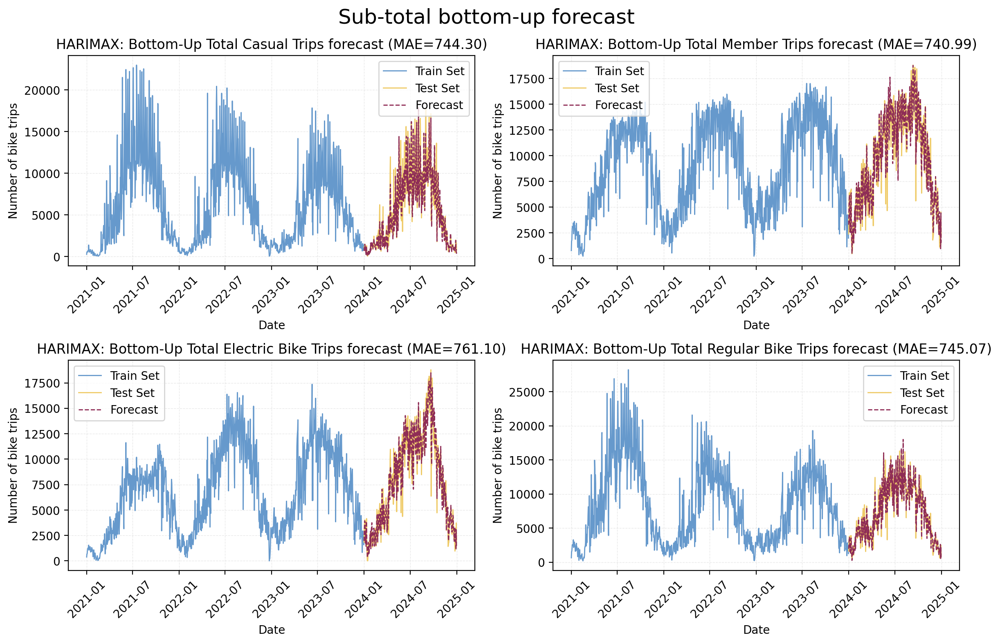

In [47]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

plot_trips(train=train["casual_total"], 
                    test=test["casual_total"],
                    forecast=pd.DataFrame(arimax_bu_casual_total_forecast, test.index),
                    title=f"HARIMAX: Bottom-Up Total Casual Trips forecast (MAE={arimax_bu_casual_total_mae:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_total"], 
                    test=test["member_total"],
                    forecast=pd.DataFrame(arimax_bu_member_total_forecast, test.index),
                    title=f"HARIMAX: Bottom-Up Total Member Trips forecast (MAE={arimax_bu_member_total_mae:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["electric_total"], 
                    test=test["electric_total"],
                    forecast=pd.DataFrame(arimax_bu_electric_total_forecast, test.index),
                    title=f"HARIMAX: Bottom-Up Total Electric Bike Trips forecast (MAE={arimax_bu_electric_total_mae:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["regular_total"], 
                    test=test["regular_total"],
                    forecast=pd.DataFrame(arimax_bu_regular_total_forecast, test.index),
                    title=f"HARIMAX: Bottom-Up Total Regular Bike Trips forecast (MAE={arimax_bu_regular_total_mae:.2f})",
                    ax=ax[1, 1])

plt.suptitle("Sub-total bottom-up forecast", fontsize=18)
plt.tight_layout()
plt.show()

##### Total forecaasting (Bottom-Up)

In [48]:
arimax_bu_total_forecast = harimax_cr_result["forecast"] + \
                            harimax_ce_result["forecast"] + \
                             harimax_mr_result["forecast"] + \
                              harimax_me_result["forecast"]

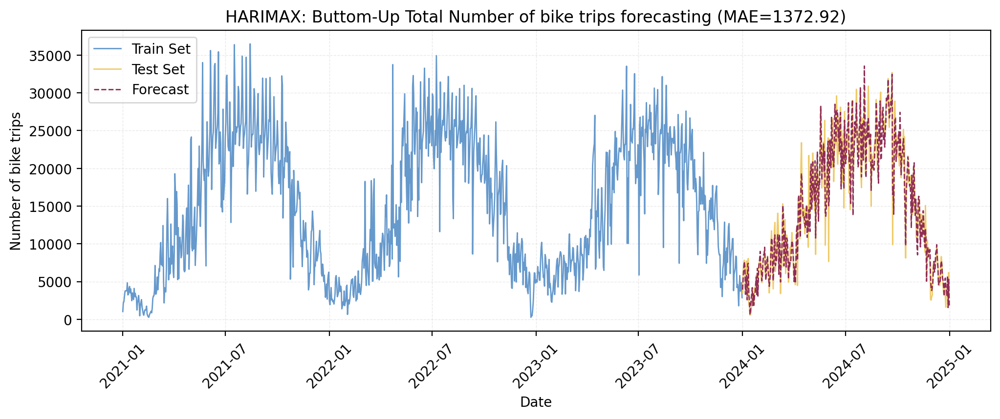

In [49]:
arimax_bu_total_mae = mean_absolute_error(test["total_rides"], arimax_bu_total_forecast)

# Viz the forecast
_, ax = plt.subplots(1, 1, figsize=(12, 4))
plot_trips(ax, train["total_rides"], test["total_rides"], 
           forecast=pd.DataFrame(arimax_bu_total_forecast, index=test.index),
           title=f"HARIMAX: Buttom-Up Total Number of bike trips forecasting (MAE={arimax_bu_total_mae:.2f})")

plt.show()

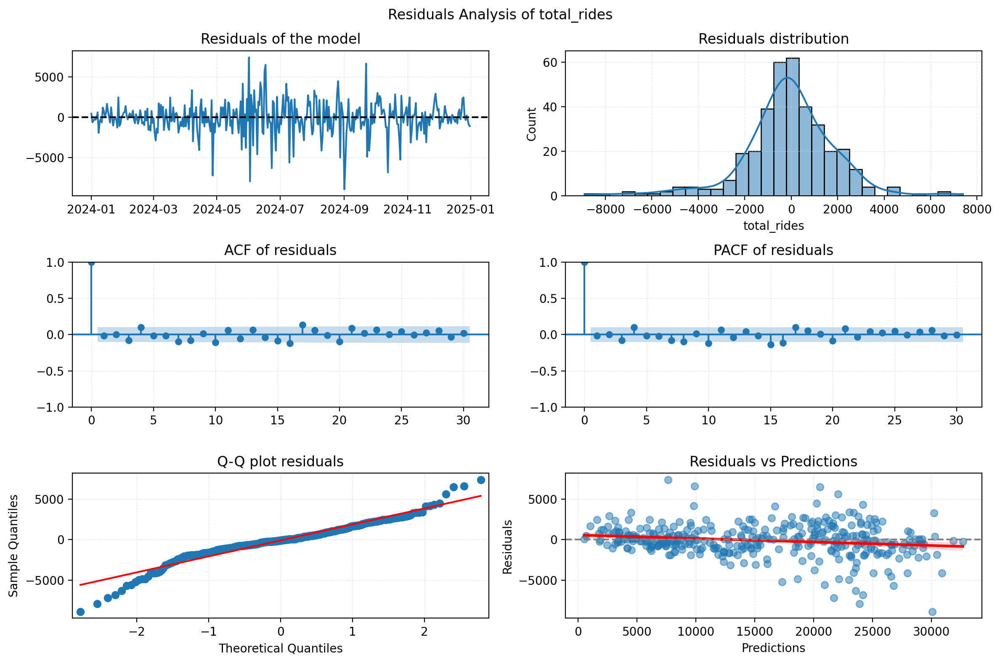


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  17.0032     0.0743
Residuals do not show significant autocorrelation

-- Dickey–Fuller test --
ADF Statistic: -5.532510328500151
p-value: 1.774443118085441e-06
Time series is stationary

-- KPSS test --
ADF Statistic: 0.03348132057160303
p-value: 0.1
Time series is stationary


In [50]:
check_residuals(arimax_bu_total_forecast, test["total_rides"], "total_rides")

In [51]:
arimax_mae_scores['bottom-up']['mae']['total_rides'] = arimax_bu_total_mae

In [52]:
arimax_mae_scores_df = pd.DataFrame({method: values['mae'] for method, values in arimax_mae_scores.items()})
arimax_mae_scores_df.index.name= "MAE"

arimax_mae_scores_df

,bottom-up,top-down
MAE,,
total_rides,"1,372.9184","1,443.2689"
regular_total,745.0698,"1,374.7365"
electric_total,761.1018,"1,348.9032"
casual_total,744.2950,"1,640.5869"
member_total,740.9927,"1,623.4135"
casual_regular_bike,406.5967,"1,137.5707"
member_regular_bike,407.0505,980.6439
casual_electric_bike,388.3748,724.9062
member_electric_bike,423.8279,"1,196.8957"


### Save results <a name='save-data'></a>

In [53]:
"""
Dump Structure

{
    # Bottom-level entry
    "target_name": {
        "level": "bottom",
        "model":{
            "order": tuple (p, d, q),
            "d": int | None,
            "forecast_type": direct|iterative,
            "mae": float,
            "forecast": np.ndarray
        }
    },

    # Cross-level or Top-level
    "target_name": {
        "level": "cross|top",
        "sum": [...],                      # Bottom-level keys to sum forecasts from
        "mae": float,
        "forecast": np.ndarray
    }
}


"""
arimax_models_dump = {
    "rnn":{
        # bottom-level
        "casual_regular_bike": {
            "level": "bottom",
            "model":{
                "order": harimax_cr_result["model_order"],
                "d": harimax_cr_result["d"],
                "forecast_type": harimax_cr_result["forecast_type"],
                "mae": harimax_cr_result["mae"],
                "forecast": harimax_cr_result["forecast"]
            }
        },
        "casual_electric_bike": {
            "level": "bottom",
            "model":{
                "order": harimax_ce_result["model_order"],
                "d": harimax_ce_result["d"],
                "forecast_type": harimax_ce_result["forecast_type"],
                "mae": harimax_ce_result["mae"],
                "forecast": harimax_ce_result["forecast"]
            }
        },
        "member_regular_bike": {
            "level": "bottom",
            "model":{
                "order": harimax_mr_result["model_order"],
                "d": harimax_mr_result["d"],
                "forecast_type": harimax_mr_result["forecast_type"],
                "mae": harimax_mr_result["mae"],
                "forecast": harimax_mr_result["forecast"]
            }
        },
        "member_electric_bike": {
            "level": "bottom",
            "model":{
                "order": harimax_me_result["model_order"],
                "d": harimax_me_result["d"],
                "forecast_type": harimax_me_result["forecast_type"],
                "mae": harimax_me_result["mae"],
                "forecast": harimax_me_result["forecast"]
            }
        },
        # cross level
        "casual_total":{
            "level": "cross",
            "sum": ["casual_regular_bike", "casual_electric_bike"],
            "mae": arimax_bu_casual_total_mae,
            "forecast": arimax_bu_casual_total_forecast
        },
        "member_total":{
            "level": "cross",
            "sum": ["member_regular_bike", "member_electric_bike"],
            "mae": arimax_bu_member_total_mae,
            "forecast": arimax_bu_member_total_mae
        },
        "electric_total":{
            "level": "cross",
            "sum": ["member_electric_bike", "casual_electric_bike"],
            "mae": arimax_bu_electric_total_mae,
            "forecast": arimax_bu_electric_total_mae
        },
        "regular_total":{
            "level": "cross",
            "sum": ["member_regular_bike", "casual_regular_bike"],
            "mae": arimax_bu_regular_total_mae,
            "forecast": arimax_bu_regular_total_mae
        },
        # top-level
        "total":{
            "level": "top",
            "sum": ["member_regular_bike", "casual_regular_bike", "member_electric_bike", "casual_electric_bike"],
            "mae": arimax_bu_total_mae,
            "forecast": arimax_bu_total_forecast
        },
    }
}

In [54]:
dirname = "../03_models/03_arimax/"
with open(dirname + "arimax_models_dump.pkl", "wb") as f:
    pickle.dump(arimax_models_dump, f)


---
\
[__<< Feature Engineering__](./04_Divvy_feature_engineering.ipynb) | [__Home__](../README.md)
\
\
Divvy: Bike Sharing Forecast, _April 2025_